# Logist regression task 

[Dataset](https://archive.ics.uci.edu/ml/datasets/Activity+Recognition+system+based+on+Multisensor+data+fusion+%28AReM%29#)
    
**Task Logistic Regression**  
~------------------------------------------~
1. WAP to read folder name and make a label in the csv with folder name
2. Remove unneccesarry info in Automated way
3. No other algorithm must be used other than Logistic Regression
4. Try to utilize multiple solvers and make multiple models
5. Provide the best models
6. EDA and all must be done accordingly
Note: No manual approaches will be appreciated

### Importing Libraries

In [1]:
import os
import pickle

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from pandas_profiling import ProfileReport

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report

from scipy import stats

### Create data/downloads directory in present path

In [2]:
data_dir = 'data'
downloads = os.path.join(data_dir, 'downloads')
os.makedirs(data_dir, exist_ok=True)
os.makedirs(downloads, exist_ok=True)

### Download the file and save it to downloads folder as "data.zip"

In [3]:
import requests


url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00366/AReM.zip'
r = requests.get(url, allow_redirects=True)

zipname = os.path.join(downloads, 'data.zip')
open(zipname, 'wb').write(r.content)

524200

### Create a folder to save the files after unzipping "data.zip"

In [4]:
import zipfile


unzip = os.path.join(data_dir, 'unzip')

with zipfile.ZipFile(zipname, 'r') as zip_ref:
    zip_ref.extractall(unzip)

### Check all the files and folders in "unzip" and hold all folders name in a list

In [5]:
import re


classes = []

folders = os.listdir(unzip)
for fol in folders:
    match = re.match(r'^[a-zA-Z0-9](?:[a-zA-Z0-9 ._-]*[a-zA-Z0-9])?\.[a-zA-Z0-9_-]+$', fol)
    if match == None:
        classes.append(fol)
else:
    print(classes)

['bending1', 'bending2', 'cycling', 'lying', 'sitting', 'standing', 'walking']


### Clean all the data in above folders and save the same structure of cleaned data in "cleaned" folder

In [6]:
import csv


cleaned = os.path.join(data_dir, 'cleaned')
os.makedirs(cleaned, exist_ok=True)

for fol in classes:
    folder = os.path.join(unzip, fol)
    files = os.listdir(folder)
    
    for file in files:
        in_filepath = os.path.join(folder, file)
        with open(in_filepath, 'r') as in_file:
            rows = csv.reader(in_file)
            
            out_folder = os.path.join(cleaned, fol)
            os.makedirs(out_folder, exist_ok=True)
            out_filepath = os.path.join(out_folder, file)
            with open(out_filepath, 'w', newline='') as out_file:
                w = csv.writer(out_file)
                
                for row in rows:
                    if '# Columns:' in row[0]:
                        row[0] = row[0].replace('# Columns: ', '')
                        h = row
                        w.writerow(row)
                        print(f'Header Created for {out_filepath}')
                        
                    elif '#' in row[0]:
                        continue
                        
                    elif len(row) > len(h):
                        print(len(row), len(h))
                        row = row[:-1]
                        w.writerow(row)
                        
                    else:
                        w.writerow(row)
                    
                        
                else:
                    print(f'{out_filepath} Created successfully')
                    print('\n')

Header Created for data\cleaned\bending1\dataset1.csv
data\cleaned\bending1\dataset1.csv Created successfully


Header Created for data\cleaned\bending1\dataset2.csv
data\cleaned\bending1\dataset2.csv Created successfully


Header Created for data\cleaned\bending1\dataset3.csv
data\cleaned\bending1\dataset3.csv Created successfully


Header Created for data\cleaned\bending1\dataset4.csv
data\cleaned\bending1\dataset4.csv Created successfully


Header Created for data\cleaned\bending1\dataset5.csv
data\cleaned\bending1\dataset5.csv Created successfully


Header Created for data\cleaned\bending1\dataset6.csv
data\cleaned\bending1\dataset6.csv Created successfully


Header Created for data\cleaned\bending1\dataset7.csv
data\cleaned\bending1\dataset7.csv Created successfully


Header Created for data\cleaned\bending2\dataset1.csv
data\cleaned\bending2\dataset1.csv Created successfully


Header Created for data\cleaned\bending2\dataset2.csv
data\cleaned\bending2\dataset2.csv Created success

data\cleaned\walking\dataset12.csv Created successfully


Header Created for data\cleaned\walking\dataset13.csv
data\cleaned\walking\dataset13.csv Created successfully


Header Created for data\cleaned\walking\dataset14.csv
data\cleaned\walking\dataset14.csv Created successfully


Header Created for data\cleaned\walking\dataset15.csv
data\cleaned\walking\dataset15.csv Created successfully


Header Created for data\cleaned\walking\dataset2.csv
data\cleaned\walking\dataset2.csv Created successfully


Header Created for data\cleaned\walking\dataset3.csv
data\cleaned\walking\dataset3.csv Created successfully


Header Created for data\cleaned\walking\dataset4.csv
data\cleaned\walking\dataset4.csv Created successfully


Header Created for data\cleaned\walking\dataset5.csv
data\cleaned\walking\dataset5.csv Created successfully


Header Created for data\cleaned\walking\dataset6.csv
data\cleaned\walking\dataset6.csv Created successfully


Header Created for data\cleaned\walking\dataset7.csv
dat

### Insert "class"column to each dataset which is same as the folder name containing the datasets and Combine all the datasets 

In [7]:
datasets = []
for fol in classes:
    folder = os.path.join(cleaned, fol)
    files = os.listdir(folder)
    
    dfs = []
    
    for file in files:
        csv_path = os.path.join(folder, file)
        
        dataframe = pd.read_csv(csv_path)
        dfs.append(dataframe)
        
    df = pd.concat(dfs)
    df['class'] = fol
    
    datasets.append(df)
    
    concat_folder = os.path.join(data_dir, 'concat')
    os.makedirs(concat_folder, exist_ok=True)
    filepath = os.path.join(concat_folder, f'{fol}.csv')
    df.to_csv(filepath, index=False)

    
df_ = pd.concat(datasets)
combined = os.path.join(data_dir, 'combined.csv')
df_.to_csv(combined, index=False)

### Reading the combined data, removing time column and mapping numerical values to target feature("class)

In [8]:
raw = pd.read_csv('data\\combined.csv')
df = raw.copy()

df = df.drop('time', axis=1)

labels_list = os.listdir('data\\cleaned')
labels_values = {labels_list[i]: (i+1) for i in range(len(labels_list))}
df['class'] = df['class'].map(labels_values)

df.sample(60)

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,class
38225,33.00,8.83,16.50,3.35,17.00,1.73,7
34062,48.00,0.00,11.67,0.47,12.75,0.83,6
8414,34.50,1.50,17.33,3.09,17.50,1.50,3
37351,36.67,2.87,9.25,3.90,17.67,2.49,7
2198,42.50,0.87,24.00,0.00,33.67,0.94,1
18027,40.25,0.83,12.00,0.00,0.00,0.00,4
13550,27.00,0.00,5.00,0.82,8.33,0.94,4
37876,34.50,4.03,13.25,3.27,20.25,2.05,7
8270,38.00,5.72,22.67,1.89,14.00,3.67,3
11672,36.00,0.00,22.00,0.71,17.67,0.47,3


In [9]:
df.describe()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,class
count,41759.000000,41759.000000,41759.000000,41759.000000,41759.000000,41759.000000,42239.000000
mean,39.021121,1.472970,14.348414,1.513248,16.011230,1.631269,4.477260
std,6.297484,2.055411,5.414506,1.644231,6.768319,1.642659,1.821487
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,35.250000,0.430000,11.500000,0.430000,12.000000,0.470000,3.000000
50%,40.000000,0.500000,15.000000,0.830000,15.750000,1.000000,5.000000
75%,44.000000,1.870000,18.000000,2.350000,19.250000,2.360000,6.000000
max,56.250000,17.240000,35.000000,11.420000,40.330000,13.610000,7.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42239 entries, 0 to 42238
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   avg_rss12  41759 non-null  float64
 1   var_rss12  41759 non-null  float64
 2   avg_rss13  41759 non-null  float64
 3   var_rss13  41759 non-null  float64
 4   avg_rss23  41759 non-null  float64
 5   var_rss23  41759 non-null  float64
 6   class      42239 non-null  int64  
dtypes: float64(6), int64(1)
memory usage: 2.3 MB


In [11]:
df.dtypes

avg_rss12    float64
var_rss12    float64
avg_rss13    float64
var_rss13    float64
avg_rss23    float64
var_rss23    float64
class          int64
dtype: object

In [12]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### <font color=blue> Function to plot and save horizontal boxplot </font>

In [13]:
import time

def plot(data, figsize):
    def _plot_path():
        data_dir = 'data'
        plot_dir = os.path.join(data_dir, 'plots')
        os.makedirs(plot_dir, exist_ok=True)

        unique_filename = time.strftime("plot_%Y%m%d_%H%M%S.png")
        plotPath = os.path.join(plot_dir, unique_filename)

        return plotPath

    def _plot_box(data, figsize):

        fig, ax = plt.subplots(figsize=figsize)
        sns.boxplot(data=df, ax=ax, orient="h")
        path = plot_path()
        plt.savefig(path)
        
    _plot_box(data, figsize)

In [14]:
%matplotlib inline

<AxesSubplot:>

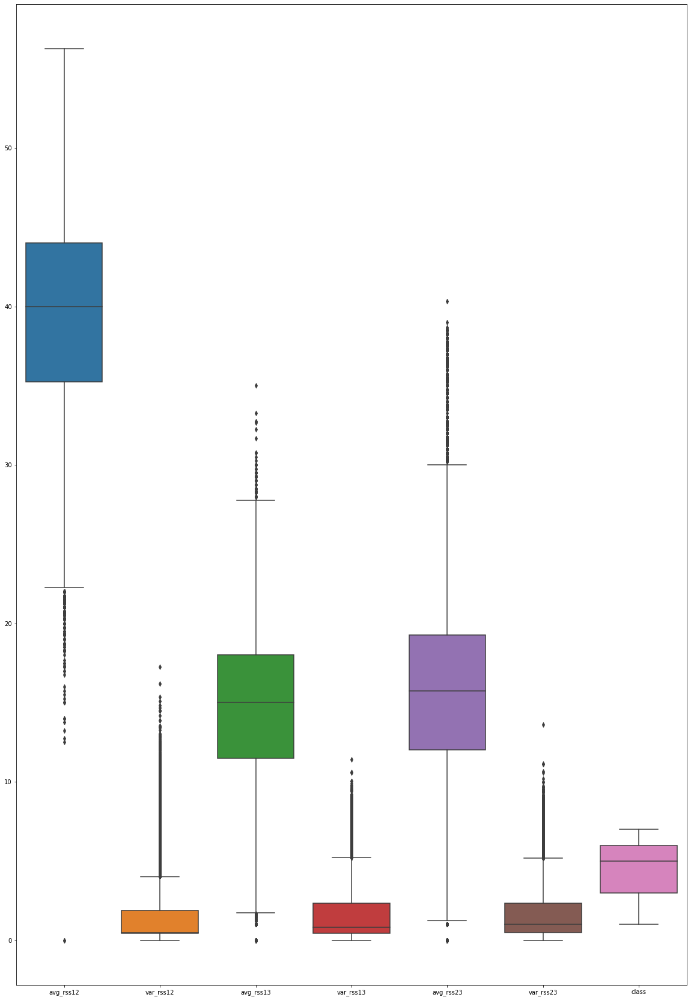

In [15]:
fig , ax = plt.subplots(figsize=(20,30))
sns.boxplot(data=df ,ax=ax)
#plot(df, (30, 20))

### Imputing null values with feature mean

In [16]:
for col in df.columns:
    df[col] = df[col].fillna(df[col].mean())

In [17]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

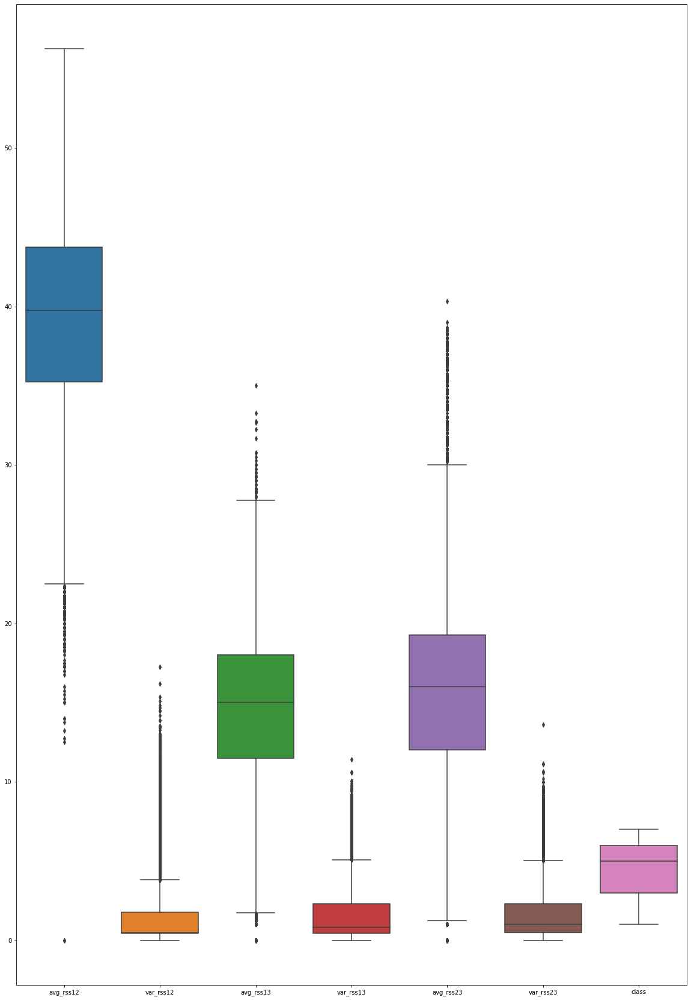

In [18]:
fig , ax = plt.subplots(figsize=(20,30))
sns.boxplot(data=df ,ax=ax)
#plot(df, (30, 20))

### <font color=blue> Function to create a VIF dataframe for any given data </font>

In [19]:
def vif_score(x):
    vif = pd.DataFrame()
    vif["FEATURE"] = x.columns
    vif["VIF_SCORE"] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    
    return vif


In [20]:
vif_score(df)

,FEATURE,VIF_SCORE
0,avg_rss12,17.365810
1,var_rss12,2.869351
2,avg_rss13,10.619131
3,var_rss13,3.058568
4,avg_rss23,9.881894
5,var_rss23,3.355112
6,class,9.016029


### <font color=blue>Function to detect outlier boundary and remove outliers</font>

In [21]:
def boundary(arr):
    q1, q3 = arr.quantile([.25, .75])

    iqr = q3 - q1

    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)

    return lower_bound, upper_bound


def remove_outlier(data, target=None):
    df = data.copy()
    
    for col in df.columns:
        if col != target:
            lb, ub = boundary(df[col])

            df = df[(df[col] > lb) & (df[col] < ub)]
            #label = label[(df[col] > lb) & (df[col] < ub)]
            
        else:
            continue
    
    return df

In [22]:
df_new = remove_outlier(df, target='class')
df_new.shape

(27691, 7)

<AxesSubplot:>

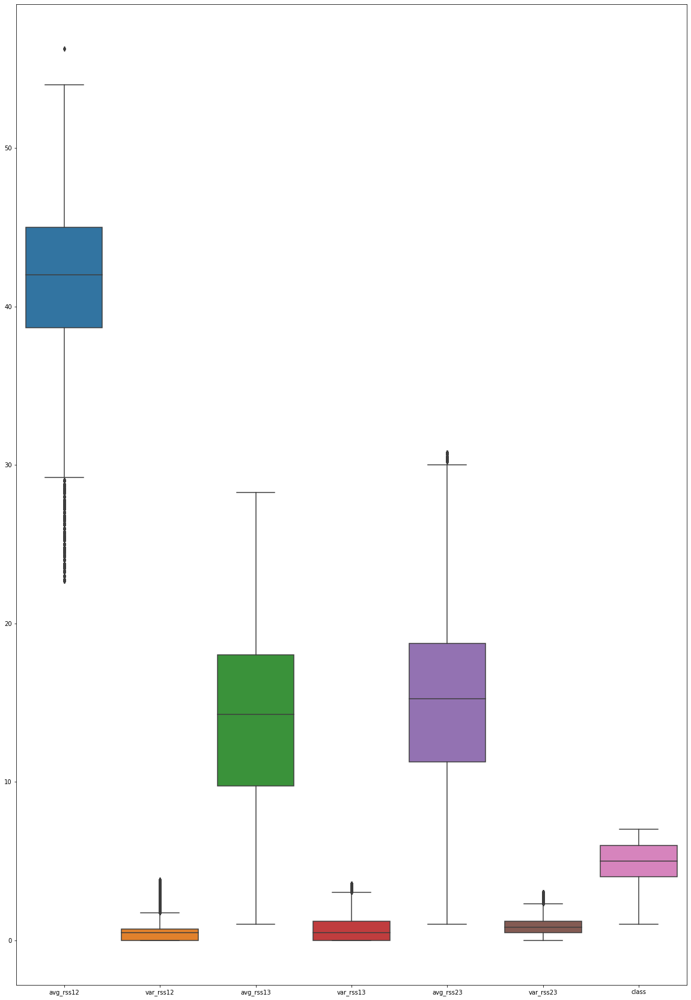

In [23]:
fig , ax = plt.subplots(figsize= (20,30))
sns.boxplot(data=df_new ,ax=ax)
#plot(df, (30, 20))

In [24]:
df_new

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,class
399,40.50,0.50,23.50,0.50,30.50,0.50,1
400,41.00,0.71,21.00,0.00,30.00,0.00,1
401,42.00,0.00,23.33,0.47,30.50,0.50,1
404,45.00,0.00,27.50,0.50,30.00,0.00,1
405,44.67,0.47,25.67,0.47,30.00,0.00,1
...,...,...,...,...,...,...,...
42197,33.25,2.49,21.75,1.09,17.50,2.29,7
42200,26.25,2.86,18.00,2.55,21.25,0.43,7
42203,36.00,3.67,16.75,1.79,14.75,2.17,7
42215,37.00,1.22,17.00,2.92,16.25,1.79,7


### Creating x, y from df_new

In [25]:
x = df_new.drop('class', axis=1)
y = df_new['class']

### Applying various scalers

In [26]:
scale = StandardScaler()
X_s = scale.fit_transform(x)
X_s= pd.DataFrame(X_s, columns=x.columns)
X_s

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0.001029,-0.112487,1.802050,-0.369877,2.619184,-0.576109
1,0.083249,0.185429,1.349260,-0.973500,2.535365,-1.303132
2,0.247688,-0.821809,1.771260,-0.406094,2.619184,-0.576109
3,0.741006,-0.821809,2.526514,-0.369877,2.535365,-1.303132
4,0.686741,-0.155046,2.195072,-0.406094,2.535365,-1.303132
...,...,...,...,...,...,...
27686,-1.191155,2.710615,1.485097,0.342399,0.439890,2.026630
27687,-2.342230,3.235513,0.805912,2.104980,1.068533,-0.677893
27688,-0.738947,4.384614,0.579518,1.187472,-0.021114,1.852145
27689,-0.574508,0.908937,0.624796,2.551661,0.230343,1.299608


In [27]:
ProfileReport(X_s)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

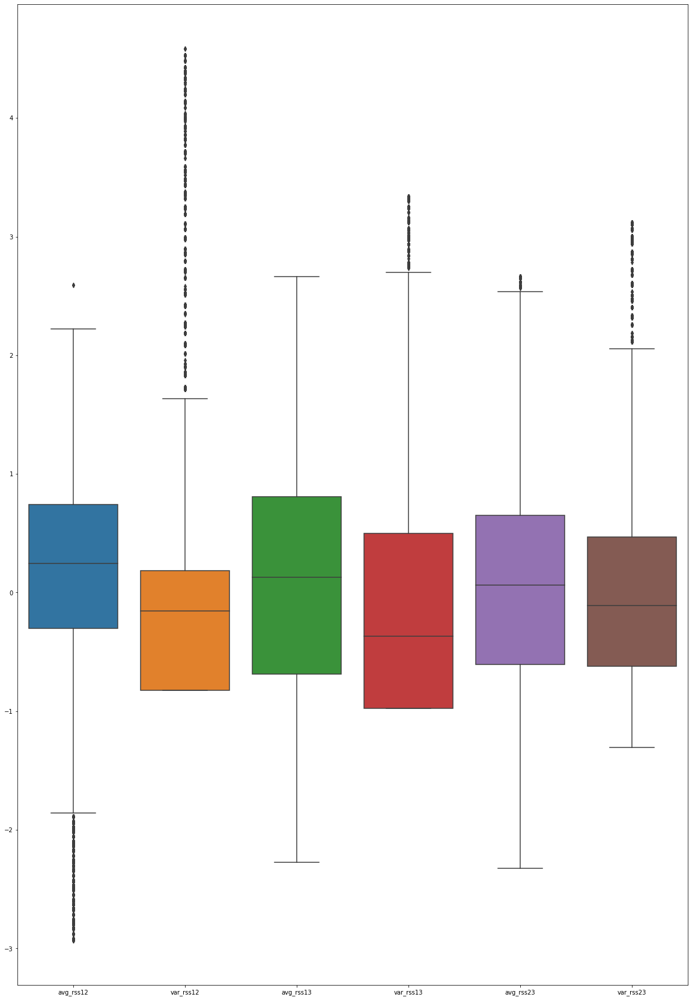

In [28]:
fig , ax = plt.subplots(figsize=(20,30))
sns.boxplot(data=X_s ,ax=ax)
#plot(X_s)

In [29]:
mscale = MinMaxScaler()
X_m = mscale.fit_transform(x)
X_m= pd.DataFrame(X_m, columns=x.columns)
X_m

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0.530971,0.131234,0.825688,0.140056,0.991597,0.164474
1,0.545861,0.186352,0.733945,0.000000,0.974790,0.000000
2,0.575640,0.000000,0.819450,0.131653,0.991597,0.164474
3,0.664979,0.000000,0.972477,0.140056,0.974790,0.000000
4,0.655152,0.123360,0.905321,0.131653,0.974790,0.000000
...,...,...,...,...,...,...
27686,0.315068,0.653543,0.761468,0.305322,0.554622,0.753289
27687,0.106611,0.750656,0.623853,0.714286,0.680672,0.141447
27688,0.396962,0.963255,0.577982,0.501401,0.462185,0.713816
27689,0.426742,0.320210,0.587156,0.817927,0.512605,0.588816


In [30]:
ProfileReport(X_m)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

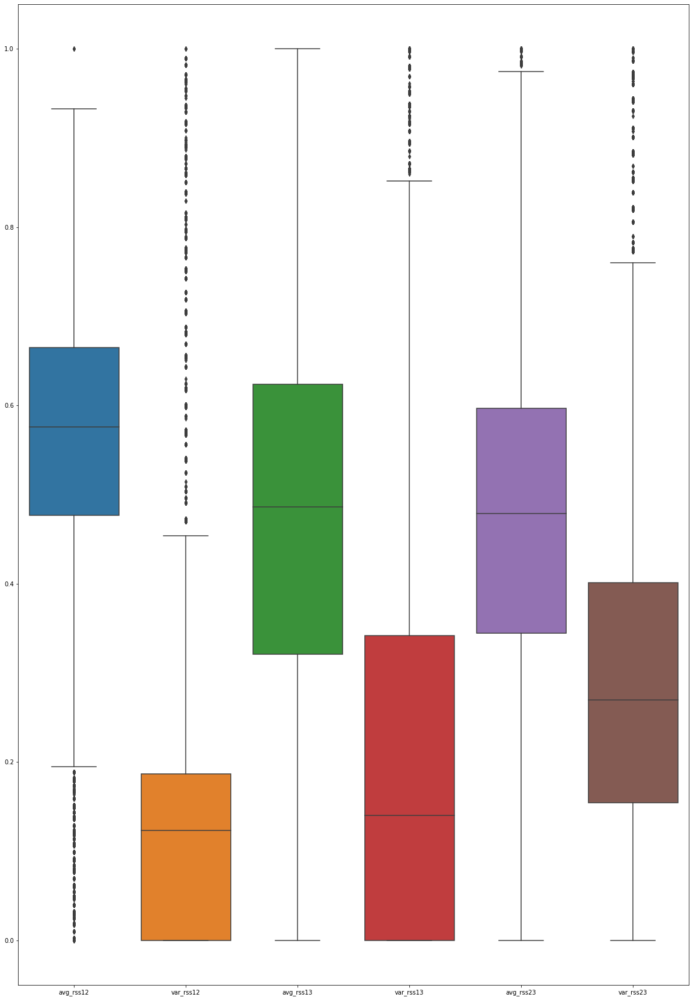

In [31]:
fig , ax = plt.subplots(figsize=(20,30))
sns.boxplot(data=X_m ,ax=ax)
#plot(X_m)

In [32]:
X_custom = (X_s + X_m)/2

In [33]:
ProfileReport(X_custom)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

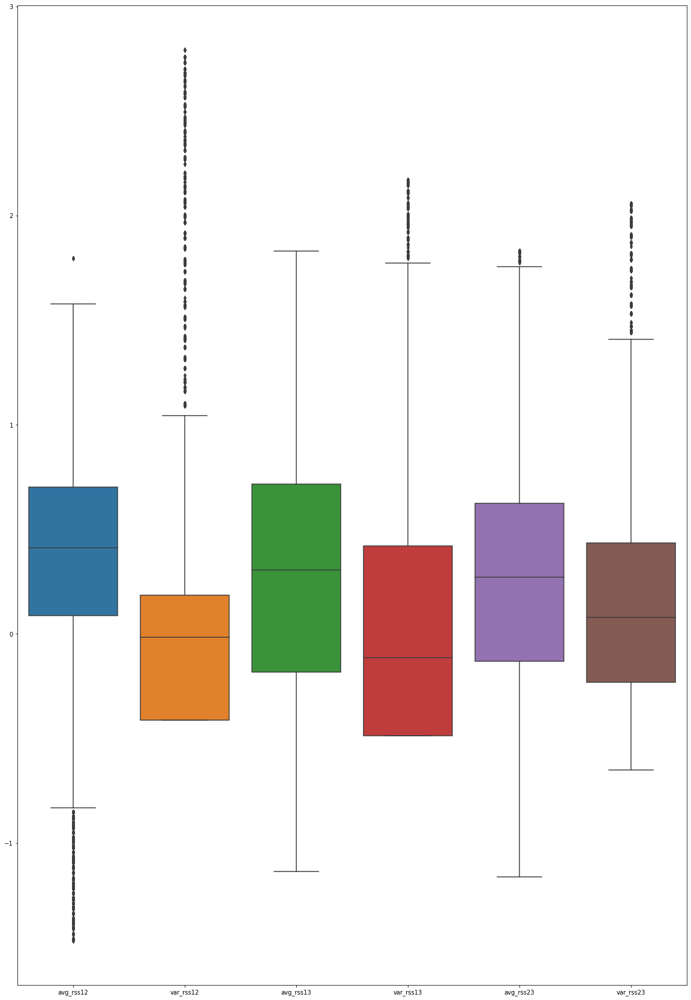

In [34]:
fig , ax = plt.subplots(figsize= (20,30))
sns.boxplot(data = X_custom ,ax = ax)
#plot(X_custom)

In [35]:
X = [X_s, X_m, X_custom]

### Train, Test, Split

In [36]:
x_train, x_test, y_train, y_test = train_test_split(X[0], y, test_size = 0.2, random_state=42)

### Building Models

In [37]:
logi1 = LogisticRegression(multi_class='multinomial', solver = 'newton-cg')
logi2 = LogisticRegression(multi_class='multinomial', solver='saga')
logi3 = LogisticRegression(multi_class='ovr', solver='sag')
logi4 = LogisticRegression(multi_class='ovr', solver='liblinear')
logi5 = LogisticRegression(multi_class='multinomial', solver='lbfgs')

### <font color=blue>Function to find all metrices for each model</font>
* Confusion matrix
* Accuracy
* Precision(Micro, Macro, Weighted)
* Recall(Micro, Macro, Weighted)
* F1-Score(Micro, Macro, Weighted)
* Classification Report
* One-vs-One AUC score
* One-vs-Rest AUC score

In [38]:
def result(model, model_name):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    model_name = ' '.join(model_name.upper().split('_'))
    print(f'Scoring {model_name}:')
    print('*'*40,'\n')
    
    confusion = confusion_matrix(y_test, y_pred)
    print(f'Cofusion Matrix:\n{"-"*25}\n{confusion}')
    
    print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_test, y_pred)))

    print('Micro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='micro')))
    print('Micro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='micro')))
    print('Micro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='micro')))

    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))

    print('Weighted Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='weighted')))
    print('Weighted Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='weighted')))
    print('Weighted F1-score: {:.2f}'.format(f1_score(y_test, y_pred, average='weighted')))

    print('='*70)
    print(f'\nClassification Report for {model_name}:')
    print('-'*50, '\n')
    print(classification_report(y_test, y_pred, target_names=list(raw['class'].unique())))

    y_pred = model.predict_proba(x_test)
    ovo_auc_score = roc_auc_score(y_test, y_pred, multi_class='ovo')
    ovr_auc_score = roc_auc_score(y_test, y_pred, multi_class='ovr')
    print(f'One-vs-One AUC score of {model_name}:{ovo_auc_score}')
    print(f'\nOne-vs-Rest AUC score of {model_name}: {ovr_auc_score}')
    print('##'*40, '\n')
    return ovo_auc_score, ovr_auc_score

In [39]:
models = {
    'multinomial_newton-cg': logi1,
    'multinomial_saga': logi2,
    'ovr_sag': logi3,
    'ovr_liblinear': logi4,
    'multinomial_lbfgs': logi5,
}

scores = {}
for k in models.keys():
    model = models[k]
    results = result(model, k)
    scores[k] = list(results)

Scoring MULTINOMIAL NEWTON-CG:
**************************************** 

Cofusion Matrix:
-------------------------
[[ 166    4   13    0  104    4    0]
 [  27  240  114   42   56    1    3]
 [   2   34  299    0   56    6   49]
 [   0   46    0 1200   26  120    0]
 [  35   92   24  181  688  303    0]
 [   6    5   18  124  391  857    0]
 [   0   19   97    0    5    1   81]]

Accuracy: 0.64

Micro Precision: 0.64
Micro Recall: 0.64
Micro F1-score: 0.64

Macro Precision: 0.62
Macro Recall: 0.59
Macro F1-score: 0.60

Weighted Precision: 0.64
Weighted Recall: 0.64
Weighted F1-score: 0.63

Classification Report for MULTINOMIAL NEWTON-CG:
-------------------------------------------------- 

              precision    recall  f1-score   support

    bending1       0.70      0.57      0.63       291
    bending2       0.55      0.50      0.52       483
     cycling       0.53      0.67      0.59       446
       lying       0.78      0.86      0.82      1392
     sitting       0.52     

In [40]:
# Creating DataFrame
scores_df = pd.DataFrame()

# Inserting values to DataFrame
scores_df['Class'] = list(scores.keys())
scores_df['OvO-AUC'] = [i[0] for i in list(scores.values())]
scores_df['OvR-AUC'] = [i[1] for i in list(scores.values())]

# Arranging Data
scores_df.Class = scores_df['Class'].str.upper()
scores_df[['Multi Class', 'Solver']] = scores_df.Class.str.split('_', expand=True)
scores_df = scores_df.drop('Class', axis=1)

scores_df = scores_df[['Multi Class', 'Solver', 'OvO-AUC', 'OvR-AUC']]
scores_df

,Multi Class,Solver,OvO-AUC,OvR-AUC
0,MULTINOMIAL,NEWTON-CG,0.916113,0.915826
1,MULTINOMIAL,SAGA,0.916113,0.915827
2,OVR,SAG,0.901048,0.906175
3,OVR,LIBLINEAR,0.900997,0.906131
4,MULTINOMIAL,LBFGS,0.916114,0.915828
